# Project n°1 : Cat or Dogs ?

Authors : Selim Ben Abdallah, Paola De Truchis, Eduardo De Jesus Zancanaro Garcia et Edda Iveland

* The goal of this project is to study, classify and segment the images in the `Oxford-IIIT Pet` dataset.
* This dataset contains images and lables of cats and dogs of 37 different races. 
We will start by loading the data, then perform an exploratory analysis. 


## 0 - Data / Libraries

In [7]:
# Standard
import os
import random

# Data Science
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from tqdm import tqdm

# Torch
import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T
import torchvision.transforms.functional as TF
from torchvision.models import vgg16, VGG16_Weights


# Sklearn
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

In [8]:
PATH_TO_TRAINVAL_TXT = "dataset/annotations/trainval.txt"
PATH_TO_TEST_TXT = "dataset/annotations/test.txt"
PATH_TO_LIST_TXT = "dataset/annotations/list.txt"

PATH_TO_IMG = "dataset/images/" # .jpg
PATH_TO_TRIMAPS = "dataset/annotations/trimaps/" #.png

- 37 category pet dataset with roughly 200 images for each class
- Images have a large variations in scale, pose and lighting.
- All images have an associated ground truth annotation of breed, head ROI, and pixel level trimap segmentation.

## 1 - Data analysis

### Species distribution

In [9]:
# List all species names + type + number

pet_dict = {}
with open(PATH_TO_LIST_TXT, 'r') as f:
    for _ in range(6):
        next(f) #to skip the 6 first lines in list.txt

    for line in f:
        line = line.strip()
        if not line:
            continue #to skip empty lines if any

        class_id, id_, species, breed_id = line.split() #to retrieve the info from each line
        specie_name = "_".join(class_id.split("_")[:-1]) #to get the specie name only

        pet_dict[class_id] = {
            "class_id": class_id, # e.g. Abyssinian_100
            "id": int(id_), # 1:37 Class ids
            "species": int(species), # 1:Cat 2:Dog
            "breed_id": int(breed_id), # 1-25:Cat 1:12:Dog
            "species_name": specie_name, # e.g. Abyssinian (without _100)
        }

In [10]:
df = pd.DataFrame.from_dict(pet_dict, orient="index")
df["species_label"] = df["species"].map({1: "Cat", 2: "Dog"})
df["img_path"] = df["class_id"].apply(lambda x: f"{PATH_TO_IMG}{x}.jpg")
df["trimap_path"] = df["class_id"].apply(lambda x: f"{PATH_TO_TRIMAPS}{x}.png")
df.head()

,class_id,id,species,breed_id,species_name,species_label,img_path,trimap_path
Abyssinian_100,Abyssinian_100,1,1,1,Abyssinian,Cat,dataset/images/Abyssinian_100.jpg,dataset/annotations/trimaps/Abyssinian_100.png
Abyssinian_101,Abyssinian_101,1,1,1,Abyssinian,Cat,dataset/images/Abyssinian_101.jpg,dataset/annotations/trimaps/Abyssinian_101.png
Abyssinian_102,Abyssinian_102,1,1,1,Abyssinian,Cat,dataset/images/Abyssinian_102.jpg,dataset/annotations/trimaps/Abyssinian_102.png
Abyssinian_103,Abyssinian_103,1,1,1,Abyssinian,Cat,dataset/images/Abyssinian_103.jpg,dataset/annotations/trimaps/Abyssinian_103.png
Abyssinian_104,Abyssinian_104,1,1,1,Abyssinian,Cat,dataset/images/Abyssinian_104.jpg,dataset/annotations/trimaps/Abyssinian_104.png


In [11]:
df["species_label"].value_counts()

species_label
Dog    4978
Cat    2371
Name: count, dtype: int64

<Axes: ylabel='count'>

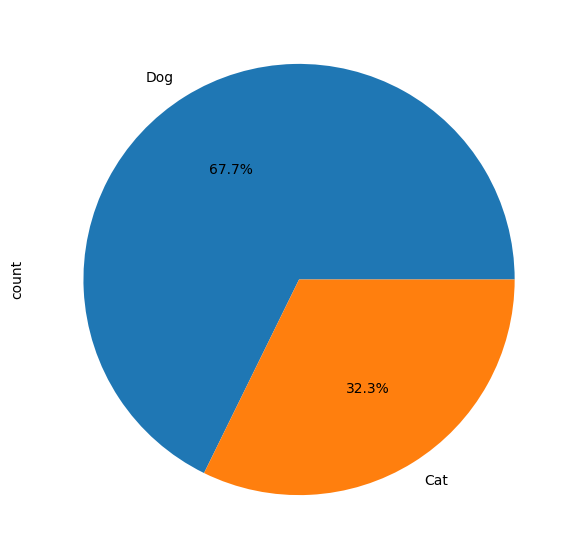

In [12]:
df["species_label"].value_counts().plot(kind="pie", autopct="%1.1f%%", figsize=(7,7))

- We see that there are more photos of dogs compared to cats in the database. There are  68% images of dogs and 32% images of cats.

<Axes: title={'center': 'Number of Pets per Species'}, xlabel='species_name'>

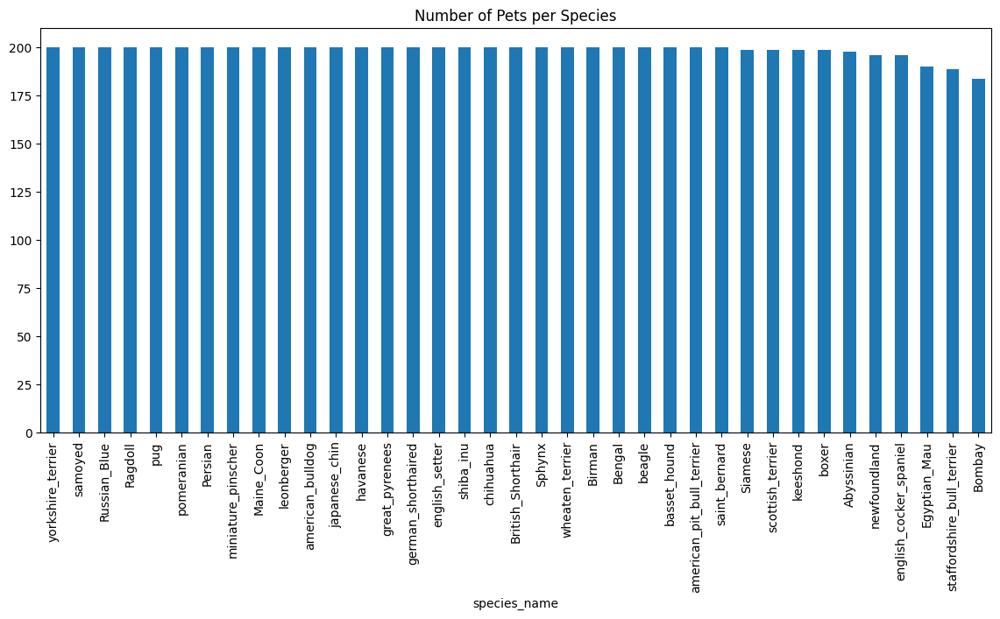

In [13]:
df["species_name"].value_counts().plot(kind="bar", figsize=(14,6), rot=90, title="Number of Pets per Species")

<Axes: title={'center': 'Cat Species Distribution'}, ylabel='count'>

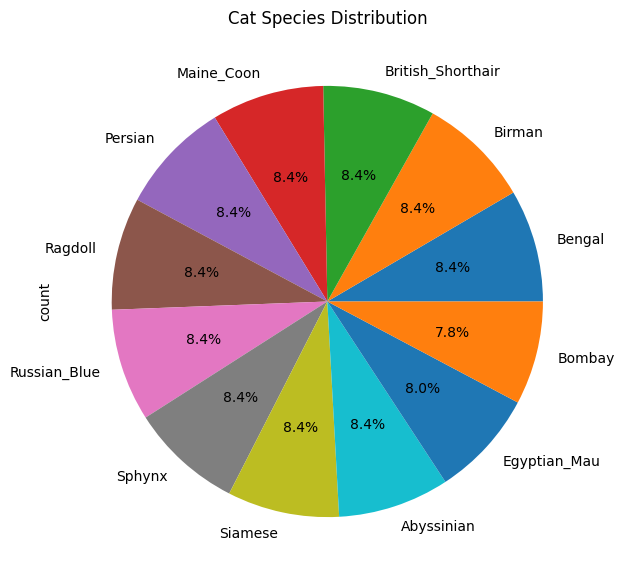

In [14]:
df[df["species"] == 1]["species_name"].value_counts().plot(
    kind="pie", autopct="%1.1f%%", figsize=(7,7), title="Cat Species Distribution"
)


<Axes: title={'center': 'Dog Species Distribution'}, ylabel='count'>

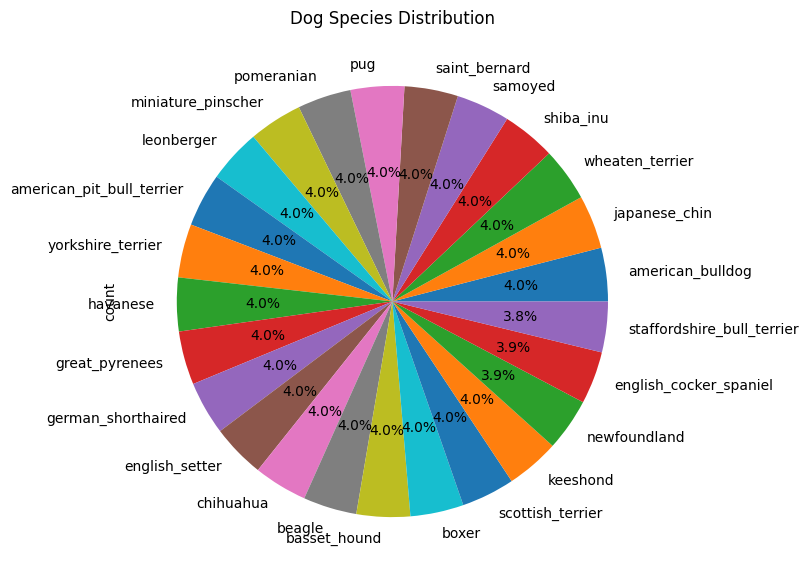

In [15]:
df[df["species"] == 2]["species_name"].value_counts().plot(
    kind="pie", autopct="%1.1f%%", figsize=(7,7), title="Dog Species Distribution"
)

All races have 200 images each, except for :

Cats: 
 - Siameses with 199 images
 - Abyssinians with 198 images
 - Egyptian_Maus with 190 images
 - Bombays with 184 images
 
Dogs: 
 - boxers with 199 images
 - keeshonds with 199 images
 - scottish_terriers with 199 images
 - english_cocker_spaniels with 196 images
 - newfoundlands with 196 images
- staffordshire_bull_terriers with 189 images

### Image and Maks

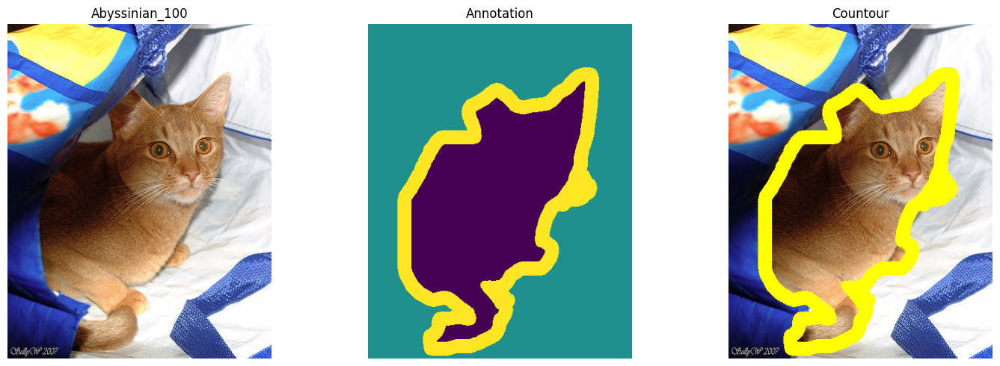

In [16]:
def show_image_annotation(class_id):
    row = df.loc[class_id] if class_id in df.index else df[df["class_id"] == class_id].iloc[0]

    img = Image.open(row["img_path"]).convert("RGB")
    ann = Image.open(row["trimap_path"])

    img_arr = np.array(img)
    ann_arr = np.array(ann)

    if img.size == ann_arr.size:
        print("the mask and image have the same size")

    overlay = img_arr.copy()
    overlay[ann_arr == 3] = [255, 255, 0]

    fig, ax = plt.subplots(1, 3, figsize=(15, 5))

    ax[0].imshow(img)
    ax[0].set_title(row["class_id"])
    ax[0].axis("off")

    ax[1].imshow(ann_arr, cmap="viridis")
    ax[1].set_title("Annotation")
    ax[1].axis("off")

    ax[2].imshow(overlay)
    ax[2].set_title("Countour")
    ax[2].axis("off")

    plt.tight_layout()
    plt.show()

show_image_annotation("Abyssinian_100")

In [17]:
def check_image_mask(df):
    missing_masks = []
    size_mismatch = []

    for idx, row in df.iterrows():
        img_path = row["img_path"]
        mask_path = row["trimap_path"]

        if not os.path.exists(mask_path):
            missing_masks.append((row["class_id"], mask_path))
            continue 
        
        img = Image.open(img_path)
        mask = Image.open(mask_path)

        if img.size != mask.size:
            size_mismatch.append((row["class_id"], img.size, mask.size))

    print("Image/Mask Check")
    print(f"Total samples: {len(df)}")
    print(f"Missing masks: {len(missing_masks)}")
    print(f"Size mismatches: {len(size_mismatch)}")
    print()

    if missing_masks:
        print("Missing masks:")
        for cid, path in missing_masks[:10]:
            print(f"  - {cid}: {path}")
        if len(missing_masks) > 10:
            print(f"  ... and {len(missing_masks) - 10} more.")
        print()

    if size_mismatch:
        print("Size mismatches (image vs mask):")
        for cid, img_size, mask_size in size_mismatch[:10]:
            print(f"  - {cid}: image={img_size}, mask={mask_size}")
        if len(size_mismatch) > 10:
            print(f"  ... and {len(size_mismatch) - 10} more.")

check_image_mask(df)

Image/Mask Check
Total samples: 7349
Missing masks: 0
Size mismatches: 0



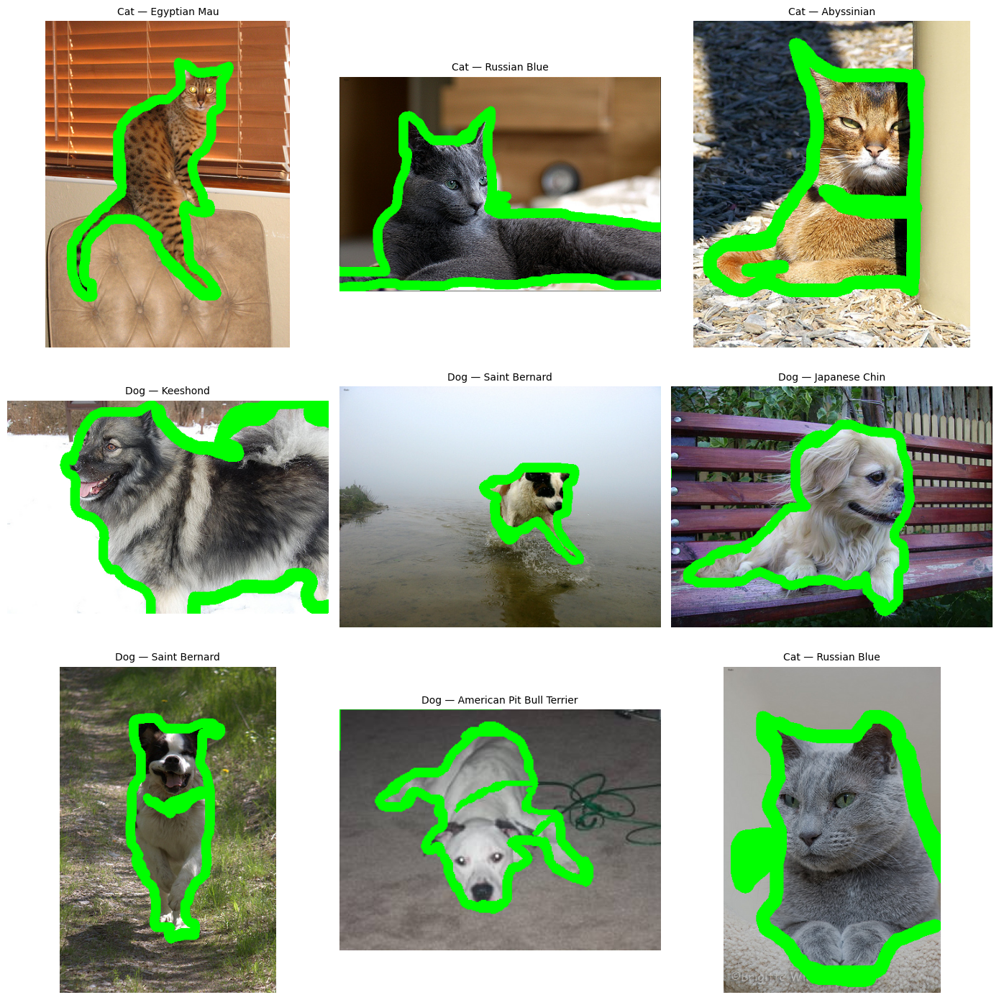

In [18]:
# Showing masking of random images

# Filter out MacOS ghost files
mask_files = [
    f for f in os.listdir(PATH_TO_TRIMAPS)
    if f.endswith(".png") and not f.startswith("._")
]

# Choose 9 random mask files
sample_masks = random.sample(mask_files, 9)

plt.figure(figsize=(14, 14))

for i, mask_file in enumerate(sample_masks, 1):
    
    # matching image filename
    img_file = mask_file.replace(".png", ".jpg")

    # --- Load image and mask ---
    img = Image.open(os.path.join(PATH_TO_IMG, img_file))
    mask = Image.open(os.path.join(PATH_TO_TRIMAPS, mask_file))

    img_arr = np.array(img)
    mask_arr = np.array(mask)

    # Overlay 
    overlay = img_arr.copy()
    overlay[mask_arr == 3] = [0, 255, 0]    # green outline

    # Extract metadata from dataframe 
    # remove ".jpg" for merging with df's image column
    image_id = img_file.replace(".jpg", "")
    
    row = df[df["class_id"] == image_id].iloc[0]
    
    species = row["species_label"].capitalize()       # Cat / Dog
    breed = row["species_name"].replace("_", " ").title()   # Pretty formatting

    title = f"{species} — {breed}"

    # --- Plot ---
    plt.subplot(3, 3, i)
    plt.imshow(overlay)
    plt.title(title, fontsize=10)
    plt.axis("off")

plt.tight_layout()
plt.show()

From studying the image masks, we have observed that the masking is done very well. No masks are missing and there is no mask and image mismatch. When drawing random images from the database, we see that the masking includes details such as collars, toys and objects that interfere with the animal. 

In [19]:
def add_image_sizes(df):
    widths = []
    heights = []

    for path in df["img_path"]:
        img = Image.open(path)
        w, h = img.size
        widths.append(w)
        heights.append(h)

    df["width"] = widths
    df["height"] = heights

add_image_sizes(df)

In [20]:
df[["width", "height"]].describe()

,width,height
count,7349.000000,7349.000000
mean,437.237447,391.387264
std,115.775876,109.394560
min,114.000000,103.000000
25%,337.000000,333.000000
50%,500.000000,375.000000
75%,500.000000,500.000000
max,3264.000000,2606.000000


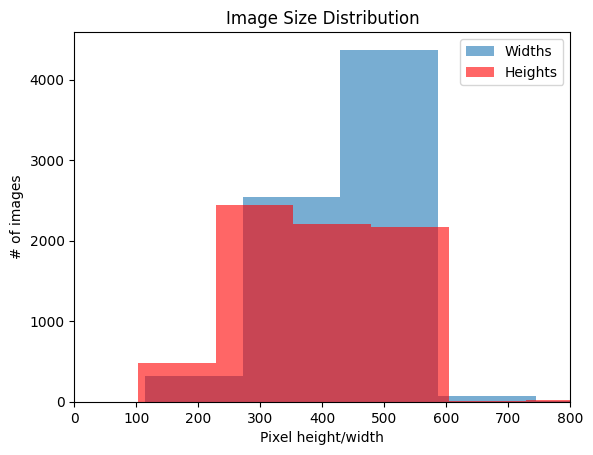

In [21]:
plt.hist(df["width"], bins=20, label= "Widths", alpha= 0.6)
plt.hist(df["height"], bins=20, color = "red", label = "Heights", alpha= 0.6)
plt.title("Image Size Distribution")
plt.xlabel("Pixel height/width")
plt.ylabel("# of images")
plt.legend()
plt.xlim(0, 800)
plt.show()

<Axes: title={'center': 'Width vs Height'}, xlabel='width', ylabel='height'>

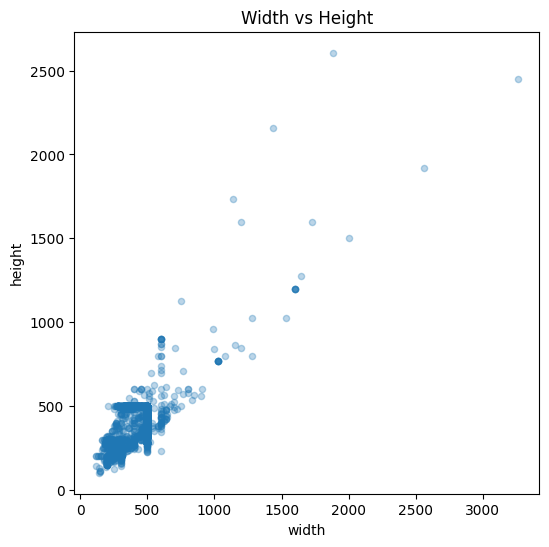

In [22]:
df.plot.scatter(x="width", y="height", alpha=0.3, figsize=(6,6), title="Width vs Height")

In [23]:
df.groupby(["width", "height"]).size().sort_values(ascending=False).head(20)

width  height
500    375       1424
       333       1069
375    500        511
333    500        509
300    225        261
500    334        250
       332        185
334    500        151
500    335         97
332    500         91
500    500         88
335    500         53
225    300         49
500    400         39
       281         29
       330         28
       376         27
400    500         27
500    374         27
357    500         26
dtype: int64

We observe that the size of the images vary significantly. We will have to normalise the image size before training our models in the next sections. 

We will now study bias of the images. Perhaps some breeds are more often photographed outside rather than inside. There could possibly be more background compared to foreground from some breeds as well. The lightning of the images could also differ from breed to breed or between dogs and cats. For this reason, we will study: 
- The average colour of the images per species and breed
- The average green intensity per species and breed
- The foreground ratio per species and breed

In [24]:
df["avg_brightness"] = df["class_id"].apply(lambda name:
    np.array(Image.open(f"dataset/images/{name}.jpg")).mean()
)

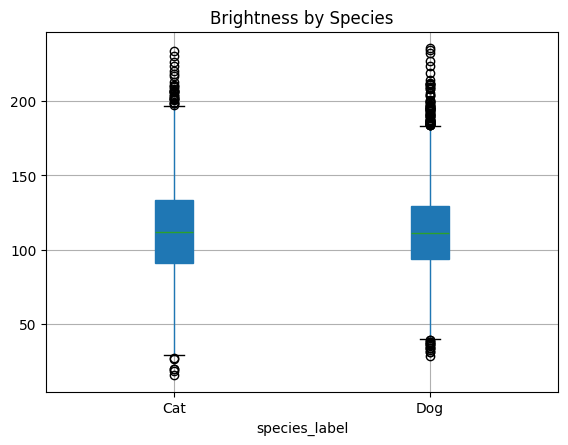

In [25]:
order_label = df.groupby("species_label")["avg_brightness"].median().sort_values(ascending=False).index

df.boxplot(column="avg_brightness", by="species_label", patch_artist=True, positions=range(len(order_label)))
plt.title("Brightness by Species")
plt.suptitle("")
plt.show()

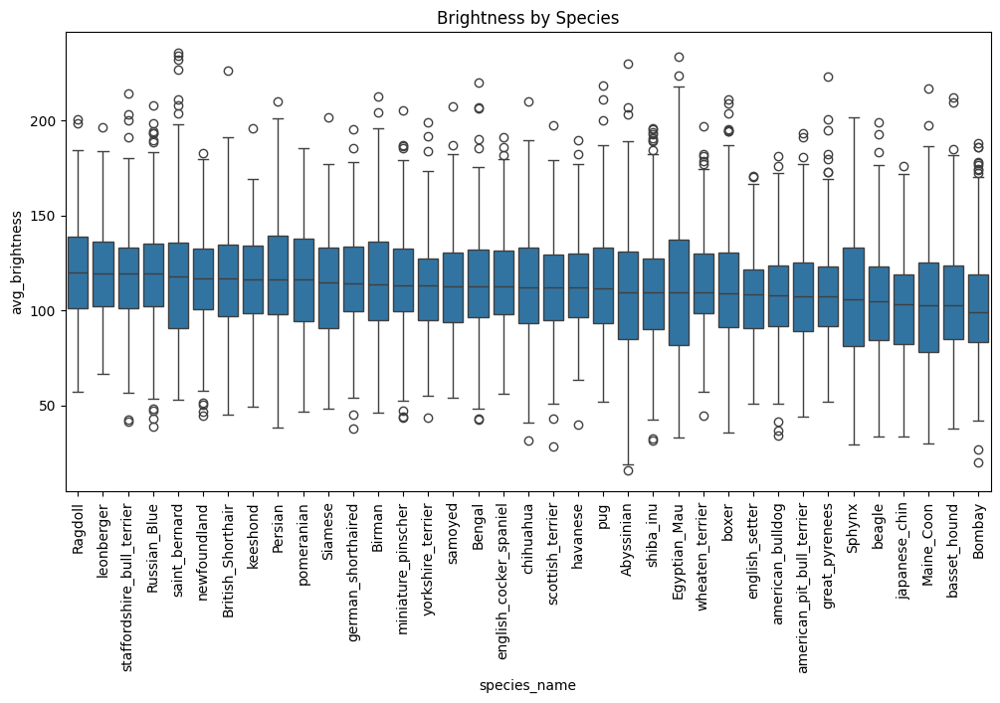

In [26]:
order_name = (
    df.groupby("species_name")["avg_brightness"].median().sort_values(ascending=False).index
)

plt.figure(figsize=(12, 6))
sns.boxplot(
    data=df,
    x="species_name",
    y="avg_brightness",
    order=order_name
)

plt.title("Brightness by Species")
plt.xticks(rotation=90)
plt.show()

In [27]:
def average_green_level(image_name):
    img_path = f"{PATH_TO_IMG}/{image_name}.jpg"
    img = np.array(Image.open(img_path))
    return img[:, :, 1].mean()     # channel 1 = green

In [28]:
df["avg_green"] = df["class_id"].apply(average_green_level)

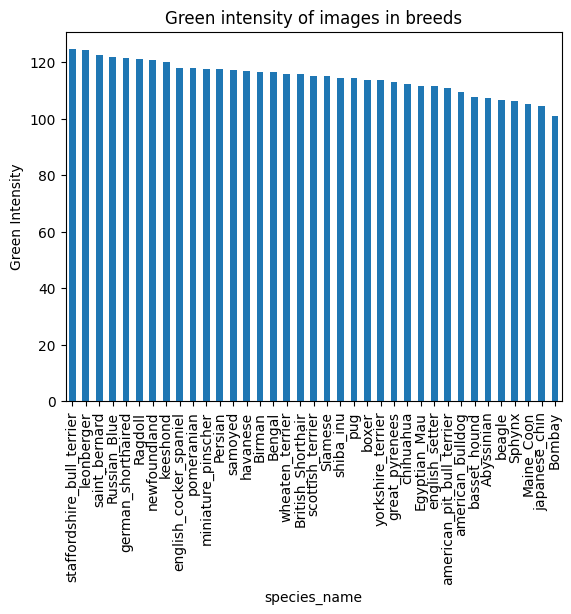

In [29]:
df.groupby("species_name")["avg_green"].mean().nlargest(37).plot(kind="bar")
plt.title("Green intensity of images in breeds")
plt.ylabel("Green Intensity")
plt.show()

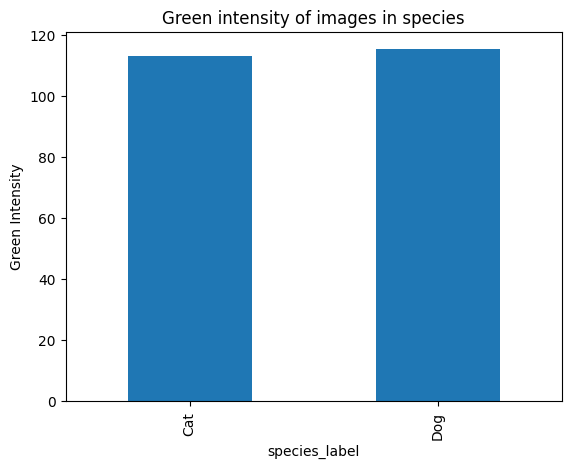

In [30]:
df.groupby("species_label")["avg_green"].mean().plot(kind="bar")
plt.title("Green intensity of images in species")
plt.ylabel("Green Intensity")
plt.show()

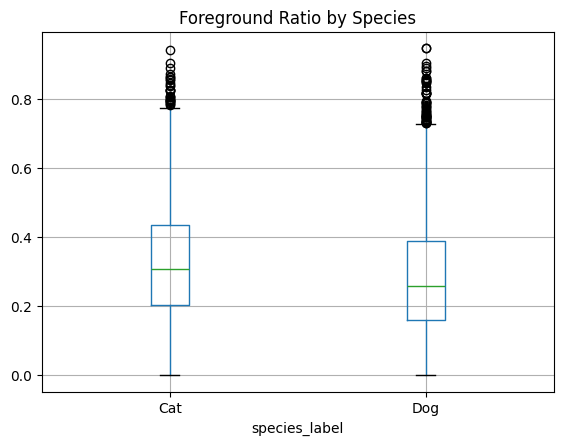

In [31]:
#Foreground Ratio to explore segmentation mask bias

foreground_ratios = []

for _, row in df.iterrows():
    mask_file = f"{row['class_id']}.png"
    mask = np.array(Image.open(f"{PATH_TO_TRIMAPS}/{mask_file}"))
    fg_ratio = (mask == 1).mean()
    foreground_ratios.append(fg_ratio)

df["fg_ratio"] = foreground_ratios

df.boxplot(column="fg_ratio", by="species_label")
plt.title("Foreground Ratio by Species")
plt.suptitle("")
plt.show()

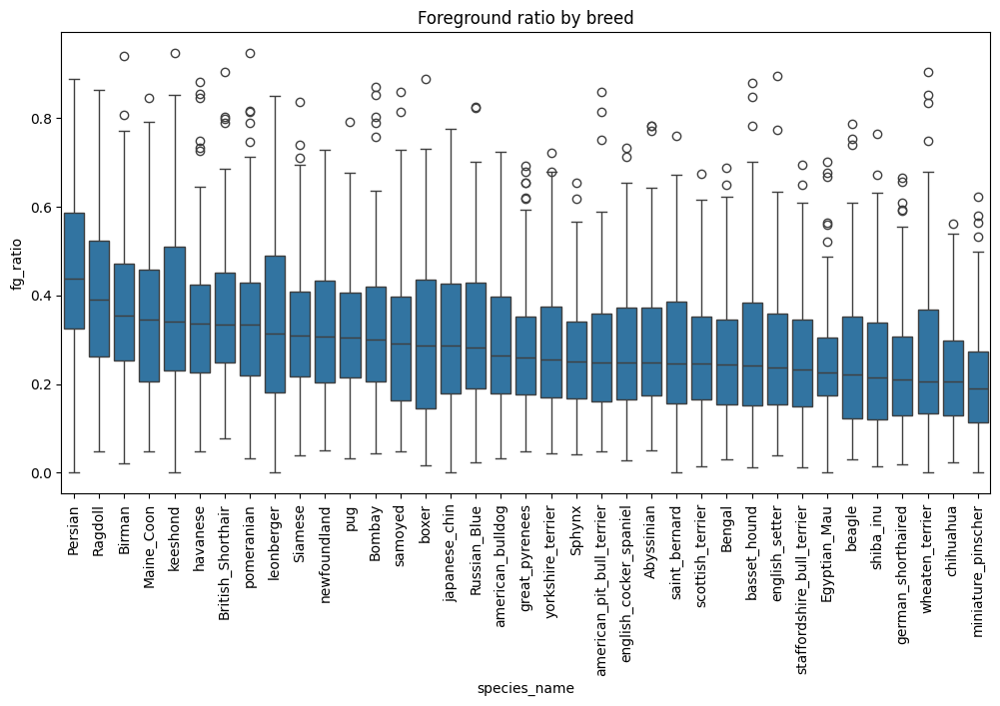

In [32]:
order_name = (
    df.groupby("species_name")["fg_ratio"].median().sort_values(ascending=False).index
)

plt.figure(figsize=(12, 6))
sns.boxplot(
    data=df,
    x="species_name",
    y="fg_ratio",
    order=order_name
)

plt.title("Foreground ratio by breed")
plt.xticks(rotation=90)
plt.show()

Overall comments on first part. 
Because of this, we will normalise the images by size and colour. We will keep the observed biases in mind when analysing the final results. 

### TrainVal / Test Datasets

In [33]:
def load_split_file(path, img_root, mask_root):
    rows = []

    with open(path, "r") as f:
        for line in f:
            parts = line.strip().split()

            class_id = parts[0]           # Abyssinian_100
            id_      = int(parts[1])      # 1–37 (class id)
            species  = int(parts[2])      # 1=cat, 2=dog
            breed_id = int(parts[3])      # 1–25 cat, 1–12 dog
            specie_name = "_".join(class_id.split("_")[:-1])

            rows.append({
                "class_id": class_id,
                "id": id_,
                "species": species,
                "breed_id": breed_id,
                "species_name": specie_name,
                "img_path": f"{img_root}/{class_id}.jpg",
                "trimap_path": f"{mask_root}/{class_id}.png",
            })

    return pd.DataFrame(rows)

In [34]:
trainval_df = load_split_file(
    "dataset/annotations/trainval.txt",
    img_root="dataset/images",
    mask_root="dataset/annotations/trimaps"
)

test_df = load_split_file(
    "dataset/annotations/test.txt",
    img_root="dataset/images",
    mask_root="dataset/annotations/trimaps"
)

# Binary label
trainval_df["label"] = trainval_df["species"].map({1: 0, 2: 1})  # 0=cat, 1=dog
test_df["label"] = test_df["species"].map({1: 0, 2: 1})

In [35]:
# Train / Val Separation
train_df, val_df = train_test_split(
    trainval_df,
    test_size=0.2,
    stratify=trainval_df["label"],
    random_state=42,
)

In [36]:
## Data transformations
pixel_size = (224,224)
mean_RGB = [0.485, 0.456, 0.406]
std_rgb = [0.229, 0.224, 0.225]

train_transform = T.Compose([
    T.Resize(pixel_size),
    T.RandomHorizontalFlip(p=0.5), #basic augm 
    T.ToTensor(),
    T.Normalize(mean = mean_RGB,
                std = std_rgb),
])

val_transform = T.Compose([
    T.Resize(pixel_size),
    T.ToTensor(),
    T.Normalize(mean = mean_RGB,
                std = std_rgb),
])

### Custom Dataset (link between Dataframe & DataLoader)

In [37]:
class PetsClassificationDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        img = Image.open(row["img_path"]).convert("RGB")
        label = int(row["label"])  # 0=cat, 1=dog

        if self.transform:
            img = self.transform(img)

        return img, label

### DataLoader

In [38]:
train_ds = PetsClassificationDataset(train_df, transform=train_transform)
val_ds   = PetsClassificationDataset(val_df,   transform=val_transform)

train_loader = DataLoader(train_ds, batch_size=32, shuffle=True,  num_workers=0)
val_loader   = DataLoader(val_ds,   batch_size=32, shuffle=False, num_workers=0)

In [39]:
label_map = {0: "Cat", 1: "Dog"}

for name, df in [("Train", train_df), ("Validation", val_df), ("Test", test_df)]:
    counts = df["label"].value_counts().sort_index()
    props  = df["label"].value_counts(normalize=True).sort_index()  # proportions

    print(f"\n{name} set:")
    for label_id in [0, 1]:
        n = counts.get(label_id, 0)
        p = props.get(label_id, 0.0)
        print(f"  {label_map[label_id]}: {n} images ({p*100:.2f}%)")


Train set:
  Cat: 950 images (32.27%)
  Dog: 1994 images (67.73%)

Validation set:
  Cat: 238 images (32.34%)
  Dog: 498 images (67.66%)

Test set:
  Cat: 1183 images (32.24%)
  Dog: 2486 images (67.76%)


- Risk : the model can get 68% accuracy by always predicting "Dog" due to the imbalance

## 3 - Binary classification

In [34]:
class CNN_V1(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.conv4 = nn.Conv2d(256, 512, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.dropout = nn.Dropout(0.2)

        self.fc1 = nn.Linear(512, 512)
        self.gap = nn.AdaptiveAvgPool2d((1, 1)) #global average pooling
        self.fc2 = nn.Linear(512, 2)  # binary classif

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))  # 224 -> 112
        x = self.pool(F.relu(self.conv2(x)))  # 112 -> 56
        x = self.pool(F.relu(self.conv3(x)))  # 56 -> 28
        x = self.pool(F.relu(self.conv4(x)))  # 28 --> 14

        x = self.gap(x) # [B, 512, 1, 1]                       
        x = x.view(x.size(0), -1) # [B, 512]            
        x = self.dropout(F.relu(self.fc1(x)))
        x = self.fc2(x)
        return x

In [35]:
device = "cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu"
print(f"Using device: {device}") # mps is for macs with Apple Silicon

model = CNN_V1().to(device)

class_weights = compute_class_weight(
    class_weight="balanced",
    classes=np.array([0,1]),
    y=train_df["label"].values
)

class_weights = torch.tensor(class_weights, dtype=torch.float32).to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-4)

Using device: mps


In [36]:
def train_one_epoch(model, loader, optimizer, criterion, device):
    model.train()
    total_loss, correct, total = 0, 0, 0

    for imgs, labels in tqdm(loader, desc="Training", leave=False):
        imgs, labels = imgs.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(imgs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        total_loss += loss.item() * imgs.size(0)
        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    return total_loss / total, correct / total


def evaluate(model, loader, criterion, device):
    model.eval()
    total_loss, correct, total = 0, 0, 0

    with torch.no_grad():
        for imgs, labels in tqdm(loader, desc="Validating", leave=False):
            imgs, labels = imgs.to(device), labels.to(device)
            outputs = model(imgs)
            loss = criterion(outputs, labels)

            total_loss += loss.item() * imgs.size(0)
            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

    return total_loss / total, correct / total

In [37]:
history = {
    "train_loss": [],
    "train_acc": [],
    "val_loss": [],
    "val_acc": [],
}

for epoch in range(30):
    train_loss, train_acc = train_one_epoch(model, train_loader, optimizer, criterion, device)
    val_loss, val_acc = evaluate(model, val_loader, criterion, device)

    history["train_loss"].append(train_loss)
    history["train_acc"].append(train_acc)
    history["val_loss"].append(val_loss)
    history["val_acc"].append(val_acc)

    # add code to save best model

    print(f"Epoch {epoch+1}: "
          f"Train Loss={train_loss:.4f}, Train Acc={train_acc:.3f} | "
          f"Val Loss={val_loss:.4f}, Val Acc={val_acc:.3f}")

Epoch 1: Train Loss=0.6934, Train Acc=0.512 | Val Loss=0.6911, Val Acc=0.349


Epoch 2: Train Loss=0.6828, Train Acc=0.567 | Val Loss=0.6679, Val Acc=0.550


Epoch 3: Train Loss=0.6764, Train Acc=0.568 | Val Loss=0.6631, Val Acc=0.592


Epoch 4: Train Loss=0.6684, Train Acc=0.577 | Val Loss=0.6564, Val Acc=0.564


Epoch 5: Train Loss=0.6675, Train Acc=0.590 | Val Loss=0.6564, Val Acc=0.636


Epoch 6: Train Loss=0.6632, Train Acc=0.599 | Val Loss=0.6576, Val Acc=0.697


Epoch 7: Train Loss=0.6605, Train Acc=0.607 | Val Loss=0.6490, Val Acc=0.575


Epoch 8: Train Loss=0.6589, Train Acc=0.601 | Val Loss=0.6565, Val Acc=0.674


Epoch 9: Train Loss=0.6594, Train Acc=0.599 | Val Loss=0.6506, Val Acc=0.702


Epoch 10: Train Loss=0.6523, Train Acc=0.619 | Val Loss=0.6308, Val Acc=0.658


Epoch 11: Train Loss=0.6496, Train Acc=0.630 | Val Loss=0.6509, Val Acc=0.516


Epoch 12: Train Loss=0.6473, Train Acc=0.622 | Val Loss=0.6264, Val Acc=0.622


Epoch 13: Train Loss=0.6438, Train Acc=0.626 | Val Loss=0.6238, Val Acc=0.677


Epoch 14: Train Loss=0.6366, Train Acc=0.645 | Val Loss=0.6146, Val Acc=0.685


Epoch 15: Train Loss=0.6318, Train Acc=0.648 | Val Loss=0.6085, Val Acc=0.671


Epoch 16: Train Loss=0.6341, Train Acc=0.650 | Val Loss=0.6235, Val Acc=0.731


Epoch 17: Train Loss=0.6230, Train Acc=0.663 | Val Loss=0.6077, Val Acc=0.675


Epoch 18: Train Loss=0.6216, Train Acc=0.664 | Val Loss=0.6012, Val Acc=0.716


Epoch 19: Train Loss=0.6138, Train Acc=0.676 | Val Loss=0.6107, Val Acc=0.582


Epoch 20: Train Loss=0.6147, Train Acc=0.671 | Val Loss=0.5942, Val Acc=0.679


Epoch 21: Train Loss=0.6053, Train Acc=0.677 | Val Loss=0.5874, Val Acc=0.628


Epoch 22: Train Loss=0.6049, Train Acc=0.669 | Val Loss=0.5868, Val Acc=0.721


Epoch 23: Train Loss=0.5934, Train Acc=0.692 | Val Loss=0.5853, Val Acc=0.728


Epoch 24: Train Loss=0.5923, Train Acc=0.694 | Val Loss=0.5877, Val Acc=0.716


Epoch 25: Train Loss=0.5862, Train Acc=0.694 | Val Loss=0.5686, Val Acc=0.713


Epoch 26: Train Loss=0.5857, Train Acc=0.692 | Val Loss=0.5849, Val Acc=0.632


Epoch 27: Train Loss=0.5787, Train Acc=0.695 | Val Loss=0.5566, Val Acc=0.686


Epoch 28: Train Loss=0.5775, Train Acc=0.710 | Val Loss=0.5902, Val Acc=0.740


Epoch 29: Train Loss=0.5633, Train Acc=0.712 | Val Loss=0.5493, Val Acc=0.724


Epoch 30: Train Loss=0.5557, Train Acc=0.720 | Val Loss=0.5465, Val Acc=0.716


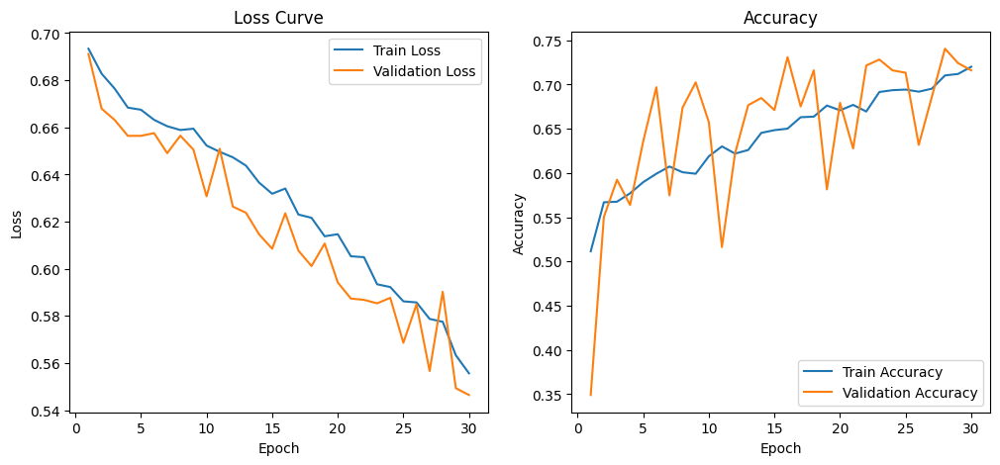

In [38]:
def plot_history(history):
    epochs = range(1, len(history["train_loss"]) + 1)

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(epochs, history["train_loss"], label="Train Loss")
    plt.plot(epochs, history["val_loss"], label="Validation Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Loss Curve")
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs, history["train_acc"], label="Train Accuracy")
    plt.plot(epochs, history["val_acc"], label="Validation Accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title("Accuracy")
    plt.legend()

    plt.show()

plot_history(history)

In [39]:
def predict_image(model, img_path, transform, device="cpu"):
    model.eval()
    img = Image.open(img_path).convert("RGB")
    tensor = transform(img).unsqueeze(0).to(device)

    with torch.no_grad():
        logits = model(tensor)
        pred = logits.argmax(dim=1).item()

    return pred, img

KeyError: 31

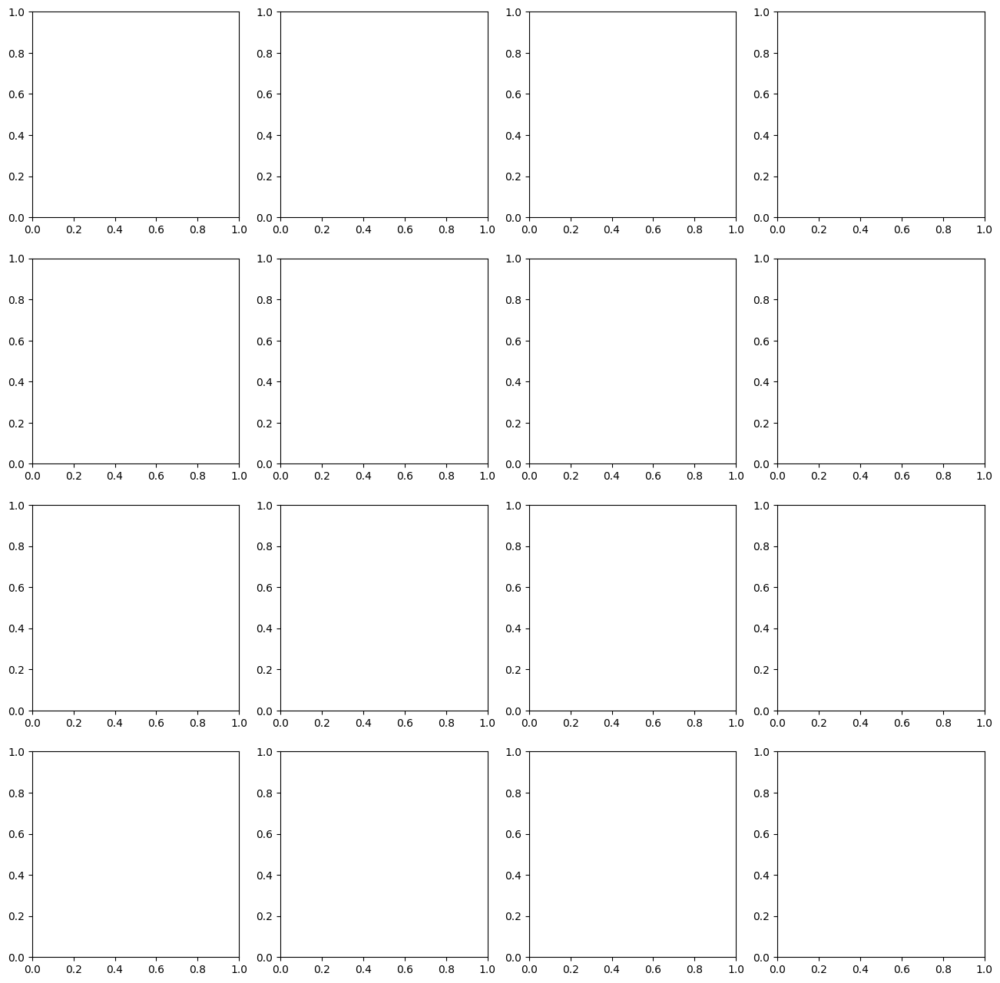

In [50]:
binary_label_map = {0: "Cat", 1: "Dog"}

def show_test_predictions(model, test_df, transform, label_map, rows=4,cols=4, device="cpu"):
    num_samples = rows*cols
    samples = test_df.sample(num_samples)
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))

    axes = axes.flatten()
    for ax, (_, row) in zip(axes, samples.iterrows()):
        pred, img = predict_image(model, row["img_path"], transform, device)
        pred_label = label_map[pred]
        true_label = label_map[row["label"]]

        ax.imshow(img)
        ax.set_title(f"Pred: {pred_label}\nTrue: {true_label}", fontsize=10)
        ax.axis("off")

    plt.tight_layout()
    plt.show()

show_test_predictions(model, test_df, val_transform,label_map=binary_label_map, rows=4, cols=4, device=device)


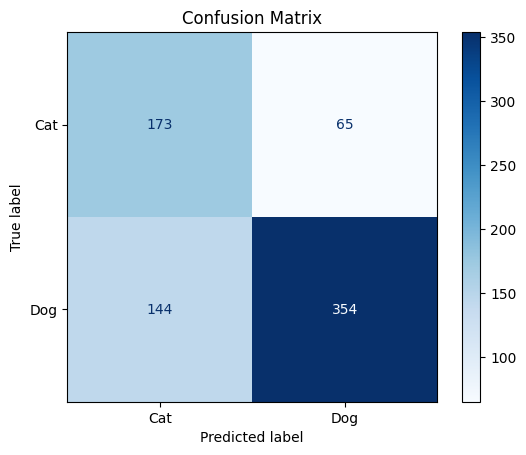

In [41]:
all_preds = []
all_labels = []

model.eval()
with torch.no_grad():
    for imgs, labels in val_loader:
        imgs = imgs.to(device)
        labels = labels.to(device)

        outputs = model(imgs)
        preds = outputs.argmax(dim=1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())


cm = confusion_matrix(all_labels, all_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Cat", "Dog"])
disp.plot(cmap="Blues", values_format="d")
plt.title("Confusion Matrix")
plt.show()


- More complex CNN (pretrained models ?)
- Save model weights
- 37-breeds classification
- Right evaluation metrics
- segmentation( U-Net, DeepLab etc)
- Transfer Learning, data augmentation

## 4 - Multi-class

In [42]:
# Multiclass label
trainval_df["label"] = trainval_df["id"] -1  # 1=Abyssinian, etc..
test_df["label"] = test_df["id"] -1

train_df_3, val_df_3 = train_test_split(
    trainval_df,
    test_size=0.2,
    stratify=trainval_df["label"],
    random_state=42,
)

train_ds_3 = PetsClassificationDataset(train_df_3, transform=train_transform)
val_ds_3   = PetsClassificationDataset(val_df_3,   transform=val_transform)

train_loader_3 = DataLoader(train_ds_3, batch_size=32, shuffle=True,  num_workers=0)
val_loader_3   = DataLoader(val_ds_3,   batch_size=32, shuffle=False, num_workers=0)

In [43]:
N_train = len(train_df_3)
N_test = len(val_df_3)
N_x_pixels = pixel_size[0]
N_y_pixels = pixel_size[1]
N_channels = len(std_rgb)
N_classes = train_df_3["label"].nunique()
N_dim_flatten = N_channels*N_x_pixels*N_y_pixels
print("Number of classes:",N_classes)
print("Size of input images (channels*pixels)", N_channels,"*",N_x_pixels,"*", N_y_pixels)
print("Train size:", N_train)
print("Val size:", N_test)

Number of classes: 37
Size of input images (channels*pixels) 3 * 224 * 224
Train size: 2944
Val size: 736


In [44]:
vgg16_mod = vgg16(weights=VGG16_Weights.IMAGENET1K_V1)
for param in vgg16_mod.features.parameters():
    param.requires_grad = False  
vgg16_mod.classifier[6] = nn.Linear(4096, 37)
vgg16_mod.to(device)

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /Users/selimbenabdallah/.cache/torch/hub/checkpoints/vgg16-397923af.pth


100%|██████████| 528M/528M [01:45<00:00, 5.26MB/s] 


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [45]:
model_multiclass = vgg16_mod

criterion = nn.CrossEntropyLoss()          # combines LogSoftmax + NLLLoss
optimizer = torch.optim.Adam(model_multiclass.classifier.parameters(),lr=1e-4)

In [46]:
history = {
    "train_loss": [],
    "train_acc": [],
    "val_loss": [],
    "val_acc": [],
}

for epoch in range(20):
    train_loss, train_acc = train_one_epoch(model_multiclass, train_loader_3, optimizer, criterion, device)
    val_loss, val_acc = evaluate(model_multiclass, val_loader_3, criterion, device)

    history["train_loss"].append(train_loss)
    history["train_acc"].append(train_acc)
    history["val_loss"].append(val_loss)
    history["val_acc"].append(val_acc)

    print(f"Epoch {epoch+1}: "
          f"Train Loss={train_loss:.4f}, Train Acc={train_acc:.3f} | "
          f"Val Loss={val_loss:.4f}, Val Acc={val_acc:.3f}")

Epoch 1: Train Loss=1.2163, Train Acc=0.660 | Val Loss=0.3466, Val Acc=0.904


Epoch 2: Train Loss=0.3141, Train Acc=0.900 | Val Loss=0.3029, Val Acc=0.906


Epoch 3: Train Loss=0.1874, Train Acc=0.939 | Val Loss=0.2968, Val Acc=0.910


Epoch 4: Train Loss=0.1263, Train Acc=0.959 | Val Loss=0.3538, Val Acc=0.891


Epoch 5: Train Loss=0.0898, Train Acc=0.972 | Val Loss=0.3291, Val Acc=0.898


Epoch 6: Train Loss=0.0471, Train Acc=0.985 | Val Loss=0.3564, Val Acc=0.902


Epoch 7: Train Loss=0.0365, Train Acc=0.987 | Val Loss=0.3859, Val Acc=0.904


Epoch 8: Train Loss=0.0434, Train Acc=0.984 | Val Loss=0.4211, Val Acc=0.885


Epoch 9: Train Loss=0.0317, Train Acc=0.990 | Val Loss=0.3899, Val Acc=0.901


Epoch 10: Train Loss=0.0315, Train Acc=0.992 | Val Loss=0.3449, Val Acc=0.898


Epoch 11: Train Loss=0.0359, Train Acc=0.988 | Val Loss=0.4125, Val Acc=0.897


Epoch 12: Train Loss=0.0189, Train Acc=0.996 | Val Loss=0.4572, Val Acc=0.891


Epoch 13: Train Loss=0.0282, Train Acc=0.992 | Val Loss=0.4072, Val Acc=0.904


Epoch 14: Train Loss=0.0169, Train Acc=0.995 | Val Loss=0.4531, Val Acc=0.899


Epoch 15: Train Loss=0.0075, Train Acc=0.997 | Val Loss=0.4807, Val Acc=0.897


Epoch 16: Train Loss=0.0116, Train Acc=0.997 | Val Loss=0.4470, Val Acc=0.910


Epoch 17: Train Loss=0.0047, Train Acc=0.999 | Val Loss=0.4692, Val Acc=0.897


Epoch 18: Train Loss=0.0236, Train Acc=0.994 | Val Loss=0.4644, Val Acc=0.902


Epoch 19: Train Loss=0.0186, Train Acc=0.994 | Val Loss=0.4909, Val Acc=0.891


Epoch 20: Train Loss=0.0354, Train Acc=0.990 | Val Loss=0.4819, Val Acc=0.906


In [47]:
torch.save(model_multiclass.state_dict(), "model_multiclass_weights.pth")

In [52]:
multi_label_map = {
    0:  "Abyssinian",
    1:  "american_bulldog",
    2:  "american_pit_bull_terrier",
    3:  "basset_hound",
    4:  "beagle",
    5:  "Bengal",
    6:  "Birman",
    7:  "Bombay",
    8:  "boxer",
    9:  "British_Shorthair",
    10: "Chihuahua",
    11: "Egyptian_Mau",
    12: "english_cocker_spaniel",
    13: "english_setter",
    14: "german_shorthaired",
    15: "great_pyrenees",
    16: "havanese",
    17: "Japanese_Chin",
    18: "keeshond",
    19: "leonberger",
    20: "Maine_Coon",
    21: "miniature_pinscher",
    22: "newfoundland",
    23: "Persian",
    24: "pomeranian",
    25: "pug",
    26: "Ragdoll",
    27: "Russian_Blue",
    28: "saint_bernard",
    29: "samoyed",
    30: "scottish_terrier",
    31: "shiba_inu",
    32: "Siamese",
    33: "Sphynx",
    34: "staffordshire_bull_terrier",
    35: "wheaten_terrier",
    36: "yorkshire_terrier"
}


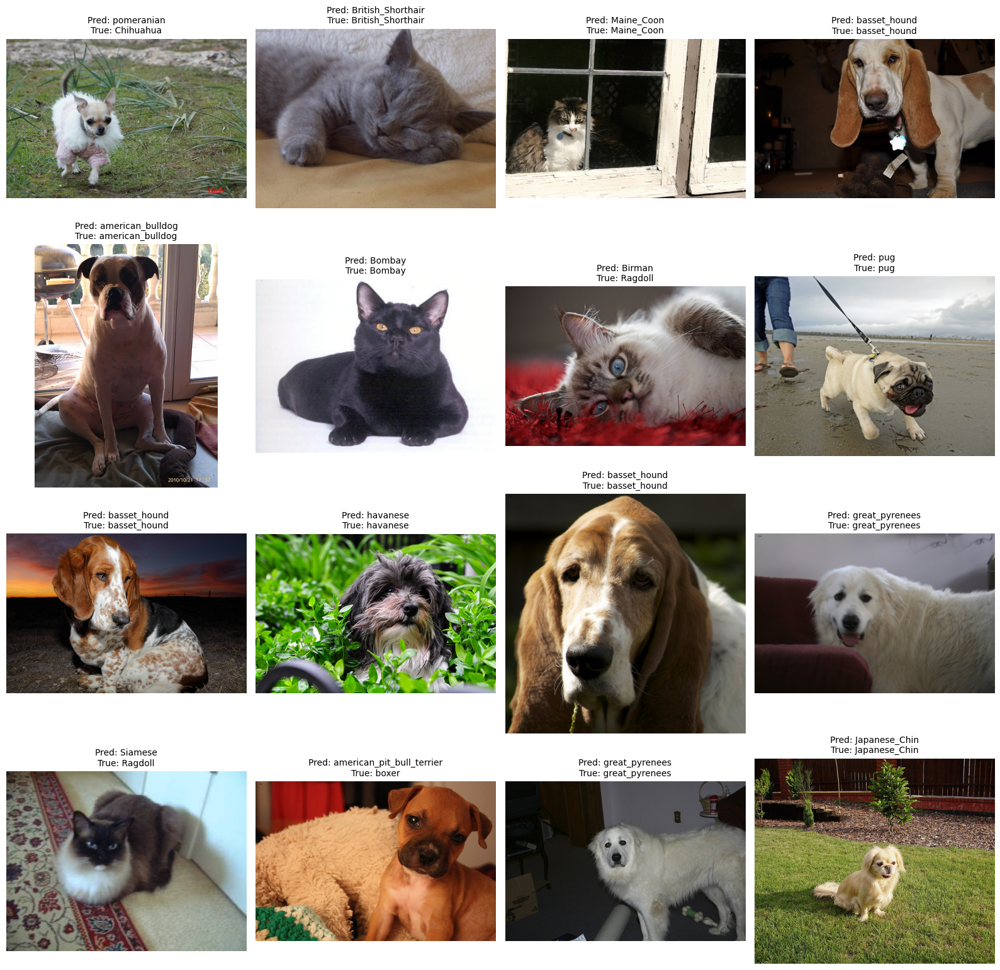

In [53]:
show_test_predictions(model_multiclass, test_df, val_transform, label_map=multi_label_map, rows=4, cols=4, device=device)

In [54]:
y_true = []
y_pred = []

model_multiclass.eval()
with torch.no_grad():
    for images, labels in val_loader_3: #val_loader??
        images = images.to(device)
        labels = labels.to(device)

        outputs = model_multiclass(images)
        _, predicted = torch.max(outputs, 1)

        y_true.extend(labels.cpu().numpy())
        y_pred.extend(predicted.cpu().numpy())

from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_true, y_pred)

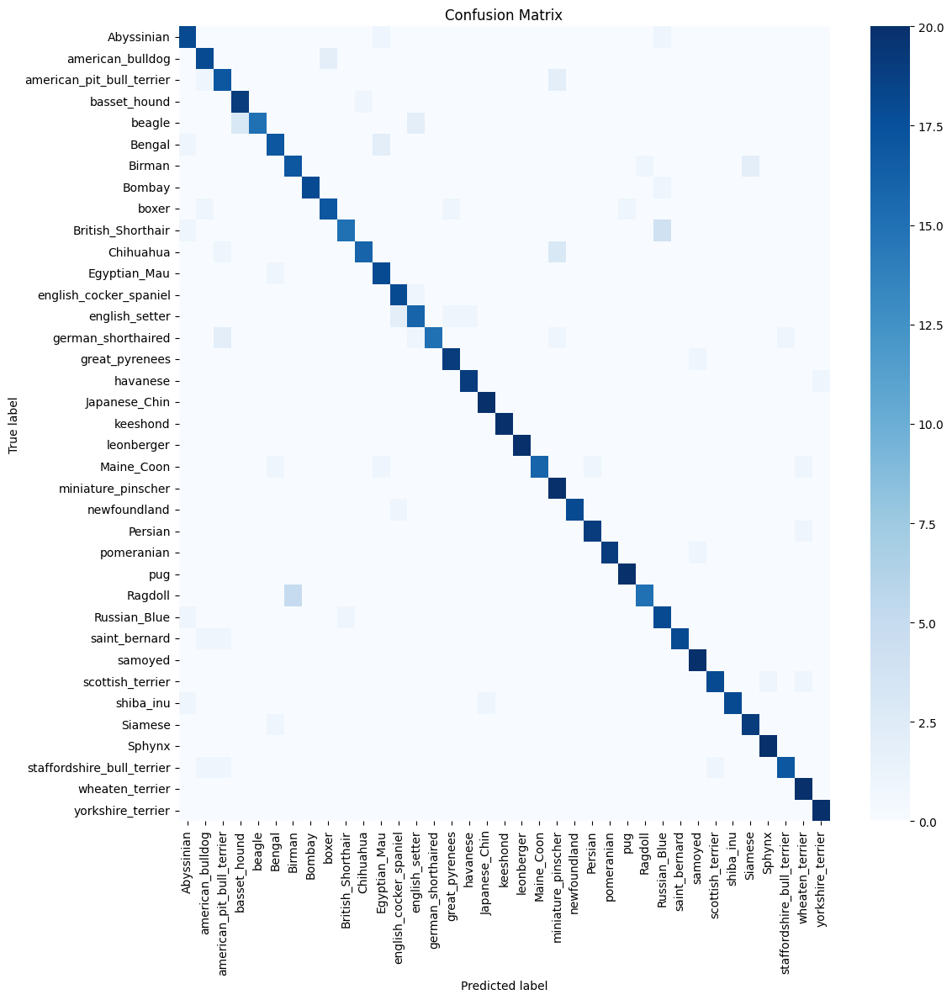

In [55]:
plt.figure(figsize=(12, 12))
sns.heatmap(cm, annot=False, cmap='Blues', 
            xticklabels=label_map.values(), 
            yticklabels=label_map.values())

plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

## 5 - Segmentation with U-Net

#### U-Net from scratch

In [59]:
def double_conv(in_channels, out_channels):
    return nn.Sequential(
        nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
        nn.BatchNorm2d(out_channels), #addd to make convergence faster
        nn.ReLU(inplace=True),
        nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
        nn.BatchNorm2d(out_channels), #addd to make convergence faster
        nn.ReLU(inplace=True)
    )

class DownSampleUNet(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DownSampleUNet, self).__init__()
        self.double_conv = double_conv(in_channels, out_channels)
        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)

    def forward(self, x):
        x = self.double_conv(x)   # now x has `out_channels`
        x_skip = x                # save for skip connection
        x = self.maxpool(x)       # downsample the features, not the raw input
        return x_skip, x


class UpSampleUNet(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.upconv = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)
        self.double_conv = double_conv(in_channels, out_channels)  
    def forward(self, x, x_skip):
        x = self.upconv(x)
        x = torch.cat((x_skip, x), dim=1)
        x = self.double_conv(x)
        return x

class UNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=3):
        super().__init__()

        self.downsample1 = DownSampleUNet(in_channels, 64)
        self.downsample2 = DownSampleUNet(64, 128)
        self.downsample3 = DownSampleUNet(128, 256)
        self.downsample4 = DownSampleUNet(256, 512)

        self.bottleneck = double_conv(512, 1024)

        self.upsample1 = UpSampleUNet(1024, 512)
        self.upsample2 = UpSampleUNet(512, 256)
        self.upsample3 = UpSampleUNet(256, 128)
        self.upsample4 = UpSampleUNet(128, 64)

        self.last_conv = nn.Conv2d(64, out_channels, kernel_size=1)

    def forward(self, x):
        x1_skip, x1 = self.downsample1(x)
        x2_skip, x2 = self.downsample2(x1)
        x3_skip, x3 = self.downsample3(x2)
        x4_skip, x4 = self.downsample4(x3)

        x_bottleneck = self.bottleneck(x4)

        x = self.upsample1(x_bottleneck, x4_skip)
        x = self.upsample2(x, x3_skip)
        x = self.upsample3(x, x2_skip)
        x = self.upsample4(x, x1_skip)

        output = self.last_conv(x)
        return output


In [60]:
class PetsSegmentationDataset(Dataset):
    def __init__(self, df, img_size=(256, 256), img_transform=None, augment=False):
        self.df = df.reset_index(drop=True)
        self.img_size = img_size          # (H, W)
        self.img_transform = img_transform  # normalization etc. (expects tensor)
        self.augment = augment

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        img = Image.open(row["img_path"]).convert("RGB")
        mask = Image.open(row["trimap_path"])

        # Resize both
        img = TF.resize(img, self.img_size, interpolation=Image.BILINEAR)
        mask = TF.resize(mask, self.img_size, interpolation=Image.NEAREST)

        # Optional joint augmentations
        if self.augment:
            if random.random() < 0.5:
                img = TF.hflip(img)
                mask = TF.hflip(mask)

        # Image -> tensor
        img = TF.to_tensor(img)

        # Mask -> class indices 0,1,2
        mask_np = np.array(mask, dtype=np.uint8)  # values 1,2,3
        mask_np = mask_np - 1                     # values 0,1,2
        mask = torch.from_numpy(mask_np.astype(np.int64))

        # Normalize image
        if self.img_transform is not None:
            img = self.img_transform(img)

        return img, mask


In [61]:
train_img_transform = T.Normalize(mean=[0.485, 0.456, 0.406],
                                  std=[0.229, 0.224, 0.225])

val_img_transform = T.Normalize(mean=[0.485, 0.456, 0.406],
                                std=[0.229, 0.224, 0.225])

train_ds = PetsSegmentationDataset(train_df, img_size=(256, 256),
                                   img_transform=train_img_transform,
                                   augment=True)

val_ds   = PetsSegmentationDataset(val_df, img_size=(256, 256),
                                   img_transform=val_img_transform,
                                   augment=False)

train_loader = DataLoader(train_ds, batch_size=8, shuffle=True,  num_workers=0)
val_loader   = DataLoader(val_ds,   batch_size=8, shuffle=False, num_workers=0)


In [62]:
def multiclass_dice_coefficient(preds, targets, num_classes=3, eps=1e-6):
    """
    preds: (N, H, W) class predictions
    targets: (N, H, W) class indices
    Returns mean Dice over all classes.
    """

    preds_one_hot = F.one_hot(preds, num_classes).permute(0, 3, 1, 2).float()
    targets_one_hot = F.one_hot(targets, num_classes).permute(0, 3, 1, 2).float()

    dims = (0, 2, 3)  # batch + spatial dims
    intersection = (preds_one_hot * targets_one_hot).sum(dims)
    union = preds_one_hot.sum(dims) + targets_one_hot.sum(dims)

    dice = (2 * intersection + eps) / (union + eps)  # per-class Dice
    return dice.mean().item()


In [63]:
def train_one_epoch_segmentation(model, loader, optimizer, criterion, device, num_classes=3):
    model.train()
    total_loss = 0.0
    total_pixels = 0
    correct_pixels = 0
    total_dice = 0.0

    for imgs, masks in tqdm(loader, desc="Training", leave=False):
        imgs = imgs.to(device)
        masks = masks.to(device, dtype=torch.long)

        optimizer.zero_grad()
        outputs = model(imgs)

        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()

        # accumulate loss
        batch_size = imgs.size(0)
        total_loss += loss.item() * batch_size

        # pixel accuracy
        preds = outputs.argmax(dim=1)
        correct_pixels += (preds == masks).sum().item()
        total_pixels += masks.numel()

        # Dice
        batch_dice = multiclass_dice_coefficient(preds, masks, num_classes)
        total_dice += batch_dice * batch_size

    avg_loss = total_loss / len(loader.dataset)
    pixel_acc = correct_pixels / total_pixels
    avg_dice = total_dice / len(loader.dataset)

    return avg_loss, pixel_acc, avg_dice



def evaluate_segmentation(model, loader, criterion, device, num_classes=3):
    model.eval()
    total_loss = 0.0
    total_pixels = 0
    correct_pixels = 0
    total_dice = 0.0

    with torch.no_grad():
        for imgs, masks in tqdm(loader, desc="Validating", leave=False):
            imgs = imgs.to(device)
            masks = masks.to(device, dtype=torch.long)

            outputs = model(imgs)
            loss = criterion(outputs, masks)

            batch_size = imgs.size(0)
            total_loss += loss.item() * batch_size

            preds = outputs.argmax(dim=1)
            correct_pixels += (preds == masks).sum().item()
            total_pixels += masks.numel()

            batch_dice = multiclass_dice_coefficient(preds, masks, num_classes)
            total_dice += batch_dice * batch_size

    avg_loss = total_loss / len(loader.dataset)
    pixel_acc = correct_pixels / total_pixels
    avg_dice = total_dice / len(loader.dataset)

    return avg_loss, pixel_acc, avg_dice




In [64]:
class DiceLoss(nn.Module):
    def __init__(self, smooth=1.0):
        super().__init__()
        self.smooth = smooth

    def forward(self, logits, targets):
        # logits: (N, C, H, W), raw scores
        # targets: (N, H, W), class indices
        num_classes = logits.shape[1]

        probs = torch.softmax(logits, dim=1)                 # (N, C, H, W)
        targets_one_hot = F.one_hot(targets, num_classes)    # (N, H, W, C)
        targets_one_hot = targets_one_hot.permute(0, 3, 1, 2).float()

        dims = (0, 2, 3)
        intersection = (probs * targets_one_hot).sum(dims)
        cardinality = probs.sum(dims) + targets_one_hot.sum(dims)

        dice = (2.0 * intersection + self.smooth) / (cardinality + self.smooth)
        loss = 1.0 - dice                                    # per-class Dice loss

        return loss.mean()

In [65]:
ce_loss   = nn.CrossEntropyLoss()
dice_loss = DiceLoss()

def combined_loss(logits, targets):
    return 0.7 * ce_loss(logits, targets) + 0.3 * dice_loss(logits, targets)

In [ ]:
device = "cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu"
print(f"Using device: {device}") # mps is for macs with Apple Silicon

model_unet = UNet(in_channels=3, out_channels=3)  # 3 classes: background, cat, dog
model_unet = model_unet.to(device)

#criterion = nn.CrossEntropyLoss()
criterion = combined_loss
optimizer = torch.optim.Adam(model_unet.parameters(), lr=1e-4, weight_decay=1e-4)

history = {
    "train_loss": [],
    "train_acc": [],
    "val_loss": [],
    "val_acc": [],
    "train_dice": [],
    "val_dice": [],
}

for epoch in range(10):
    train_loss, train_acc, train_dice = train_one_epoch_segmentation(model_unet, train_loader, optimizer, criterion, device)
    val_loss, val_acc, val_dice = evaluate_segmentation(model_unet, val_loader, criterion, device)

    history["train_loss"].append(train_loss)
    history["train_acc"].append(train_acc)
    history["val_loss"].append(val_loss)
    history["val_acc"].append(val_acc)
    history["train_dice"].append(train_dice)
    history["val_dice"].append(val_dice)

    print(f"Epoch {epoch+1}: "
          f"Train Loss={train_loss:.4f}, Acc={train_acc:.3f}, Dice={train_dice:.3f} | "
          f"Val Loss={val_loss:.4f}, Acc={val_acc:.3f}, Dice={val_dice:.3f}")

Using device: mps


Epoch 1: Train Loss=0.6029, Acc=0.739, Dice=0.627 | Val Loss=0.4809, Acc=0.798, Dice=0.698


Training:  77%|███████▋  | 282/368 [02:49<00:52,  1.65it/s]

In [ ]:
torch.save(model_unet.state_dict(), "model_unet_weights.pth")

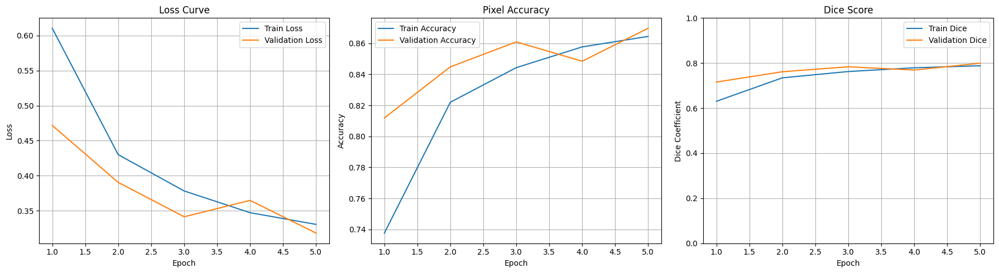

In [54]:
def plot_history_segmentation(history):
    epochs = range(1, len(history["train_loss"]) + 1)

    plt.figure(figsize=(18, 5))

    # -------------------- Loss --------------------
    plt.subplot(1, 3, 1)
    plt.plot(epochs, history["train_loss"], label="Train Loss")
    plt.plot(epochs, history["val_loss"], label="Validation Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Loss Curve")
    plt.legend()
    plt.grid(True)

    # -------------------- Accuracy --------------------
    plt.subplot(1, 3, 2)
    plt.plot(epochs, history["train_acc"], label="Train Accuracy")
    plt.plot(epochs, history["val_acc"], label="Validation Accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title("Pixel Accuracy")
    plt.legend()
    plt.grid(True)

    # -------------------- Dice Coefficient --------------------
    plt.subplot(1, 3, 3)
    plt.plot(epochs, history["train_dice"], label="Train Dice")
    plt.plot(epochs, history["val_dice"], label="Validation Dice")
    plt.xlabel("Epoch")
    plt.ylabel("Dice Coefficient")
    plt.title("Dice Score")
    plt.ylim(0, 1)  # Dice always between 0 and 1
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()
    
plot_history_segmentation(history)

In [55]:
COLORS = np.array([
    [0, 0, 0],        # class 0 → black
    [255, 255, 0],    # class 1 → yellow
    [255, 0, 0],      # class 2 → red
], dtype=np.uint8)

def mask_to_rgb(mask):
    """
    mask: torch.Tensor or numpy array, shape (H, W), values 0/1/2
    returns: RGB numpy array (H, W, 3)
    """
    if torch.is_tensor(mask):
        mask = mask.cpu().numpy()
    return COLORS[mask]


In [56]:
def visualize_sample(model, dataset, index, device):
    model.eval()

    img, mask = dataset[index]
    
    # img: normalized → show un-normalized version
    img_np = img.cpu().numpy().transpose(1, 2, 0)  # (H, W, C)
    
    # undo normalization for display
    img_np = img_np * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
    img_np = np.clip(img_np, 0, 1)
    mask_rgb = mask_to_rgb(mask) # ground truth mask → RGB

    with torch.no_grad():
        pred = model(img.unsqueeze(0).to(device))      # (1, C, H, W)
        pred = pred.argmax(dim=1)[0].cpu()             # (H, W)

    pred_rgb = mask_to_rgb(pred)

    plt.figure(figsize=(12, 4))
    
    plt.subplot(1, 3, 1)
    plt.imshow(img_np)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(mask_rgb)
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(pred_rgb)
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.show()


In [57]:
test_df = load_split_file(
    "dataset/annotations/test.txt",
    img_root="dataset/images",
    mask_root="dataset/annotations/trimaps"
)

test_ds = PetsSegmentationDataset(
    test_df,
    img_size=(256, 256),
    img_transform=val_img_transform,    # same normalization as val
    augment=False
)


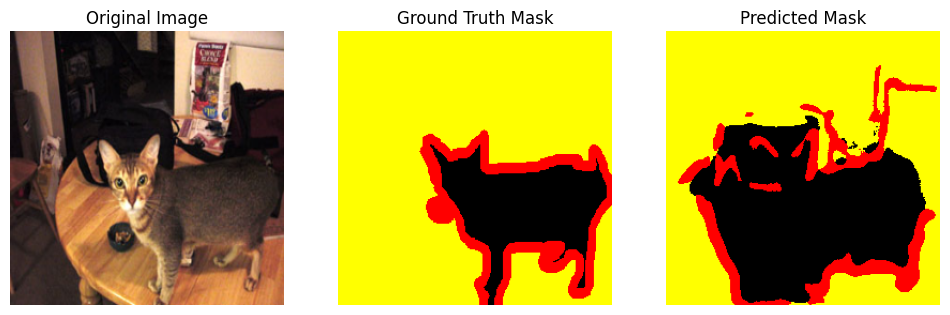

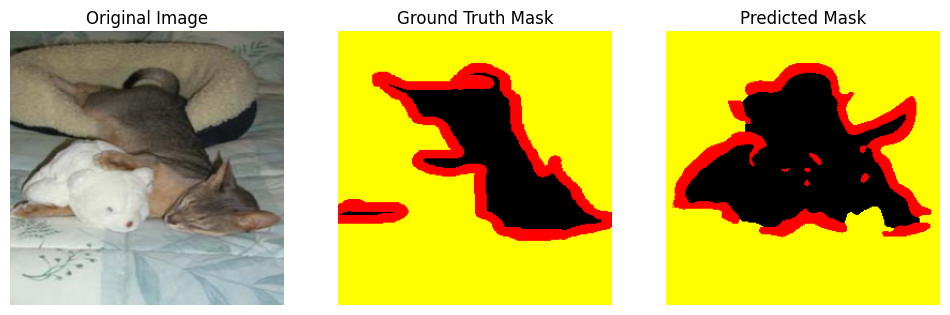

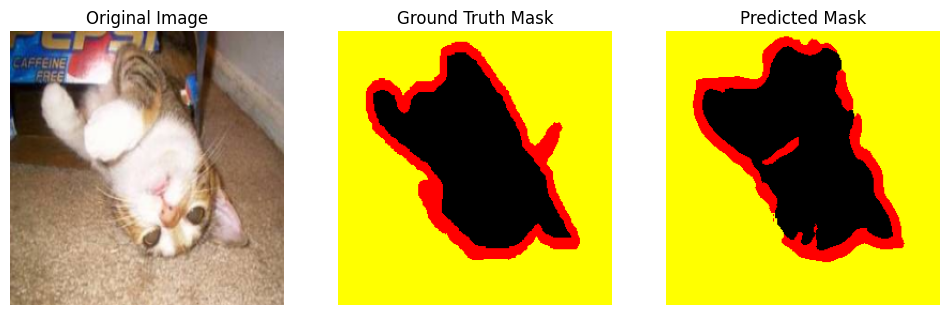

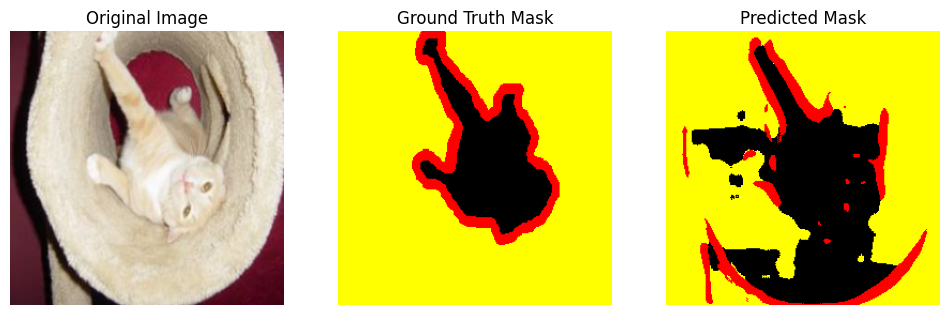

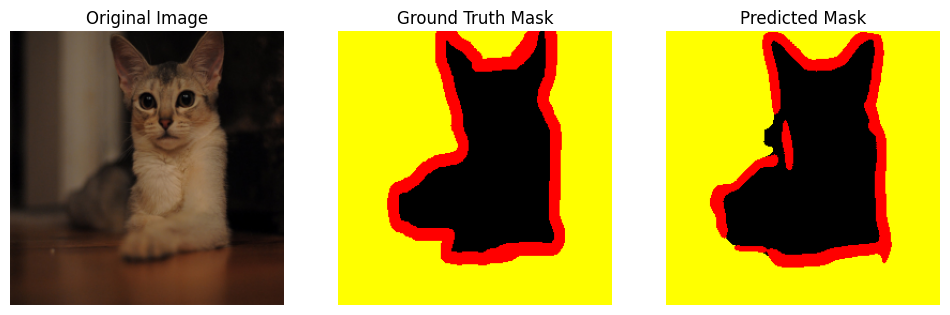

In [ ]:
for i in [0, 5, 10, 20, 50]:
    visualize_sample(model_unet, test_ds, index=i, device=device)
